# Swisstopo vs IGN in MontBlanc area

* Much more detail on Swisstopo
  * Especially at zoom 16
* Clearer & more present cliff rendering
* Less colorful & narrower path -> better for overlaying slopes
* But poorer "touristic" data ie parking, climbing spots, GR ...


In [1]:
%load_ext autoreload
%autoreload 2

import os
NBROOT = os.path.realpath(os.curdir)

import sys
sys.path.append(os.path.realpath('../../eslope/development'))

In [2]:
# Preamble

import logging
logging.basicConfig(level=logging.DEBUG)
logging.getLogger('PIL').level = logging.INFO # PIL.PngImagePlugin

from dataclasses import astuple

import os
from os.path import exists, join as pjoin, realpath, expanduser
import sqlite3
from pathlib import Path
from time import time
from urllib.error import HTTPError
from urllib.request import urlopen, urlretrieve

#external
from IPython.display import display, Image
from PIL import Image as Img
import mercantile as T

from src import bbox as BB, mbt_util as M, img_util as G

In [3]:
dir = 'geo/data/sample_topo'
os.makedirs(dir, exist_ok=True)
%cd $dir

/home/me/code/eddy-geek/TIL/geo/data/sample_topo


In [4]:
os.makedirs('tiles', exist_ok=True)

In [8]:
from random import randint

def ch_url(tileset, format):  # only landeskarte-10 is png
    return lambda z, x, y: f'https://wmts100.geo.admin.ch/1.0.0/ch.swisstopo.{tileset}/default/current/3857/{z}/{x}/{y}.{format}'

def scale2tileset(scale):
    if scale==10:
        return 'landeskarte-farbe-10', 'png'
    else:
        assert scale in (25, 50, 100, 200, 500, 1000, 10000)
        return f'pixelkarte-farbe-pk{scale}.noscale', 'jpeg'

def geturl_ch_downsampled(z, x, y):
    return ch_url(*scale2tileset(dw_tilescale[z]))(z, x, y)

dw_tilescale = [1000]*9 + [1000, 1000, 500, 200, 100, 50, 25, 10]

def ignweburl(z, x, y):
    # for top25 zoomed out: =GEOGRAPHICALGRIDSYSTEMS.MAPS.SCAN25TOUR
    return ( 'https://wxs.ign.fr/8jdgffs9i650h6hukfxdip4v/geoportail/wmts?'
             'Layer=GEOGRAPHICALGRIDSYSTEMS.MAPS&Style=normal&TileMatrixSet=PM&SERVICE=WMTS&'
            f'REQUEST=GetTile&VERSION=1.0.0&FORMAT=image/jpeg&TileMatrix={z}&TileCol={x}&TileRow={y}')


datasets = {
    'bugianen':   expanduser('~/Downloads/dwnmaps/mapdata/mbtiles/Bugianen/Bugianen.mbtiles'),
    'kompass':    expanduser('~/Downloads/dwnmaps/mapsoft/MOBAC-2.1.4/atlases/Kompass_dolo.mbtiles'),
    'chdz':      '../sample_ch/mch.mbtiles',
    'chdzweb':    geturl_ch_downsampled,
    'chweb':      ch_url('pixelkarte-farbe', 'jpeg'),
    'cyclosm':    lambda z, x, y: f'https://c.tile-cyclosm.openstreetmap.fr/cyclosm/{z}/{x}/{y}.png',
    'kompassweb': lambda z, x, y: f'http://ec{randint(0, 3)}.cdn.ecmaps.de/WmsGateway.ashx.jpg?Experience=ecmaps&MapStyle=KOMPASS%20Touristik&TileX={x}&TileY={y}&ZoomLevel={z}',
    'ignweb':     ignweburl,
    'ocm':        lambda z, x, y: (f'https://a.tile.opencyclemap.org/cycle/{z}/{x}/{y}.png', 'http://www.openstreetmap.org/'),
    'mri':        lambda z, x, y: f'https://maps.refuges.info/hiking/{z}/{x}/{y}.png',
    'otm':        lambda z, x, y: f'https://c.tile.opentopomap.org/{z}/{x}/{y}.png',
    '4umaps':     lambda z, x, y: f'https://tileserver.4umaps.com/{z}/{x}/{y}.png',
}

def makepy(dname, llname, zooms=range(9, 17)):
    ll = getattr(BB, 'll'+llname)  # eg BB.lldolo
    src = datasets[dname]
    makepyfun = M.tile_pyramid if isinstance(src, str) else G.tile_pyramid_url
    makepyfun(f'{llname}_{dname}.jpeg', ll, src, zooms)
    return Image(filename=f'{llname}_{dname}.jpeg')


## Mont-Blanc Area: vs SwissTopo

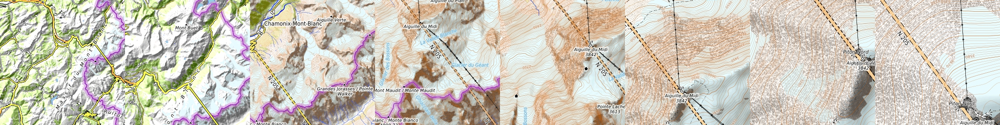

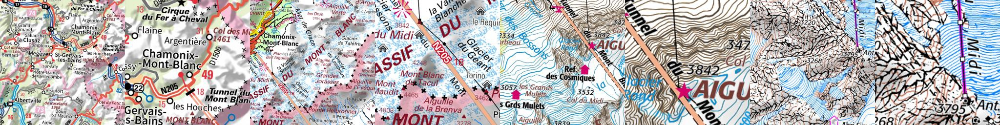

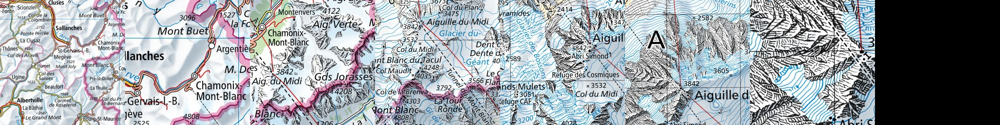

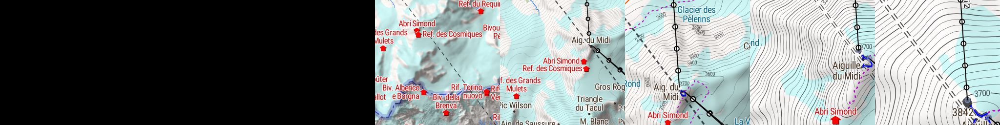

In [9]:
for dname in 'otm', 'ignweb', 'chdz', 'bugianen' :
    display(makepy(dname, 'midi'))

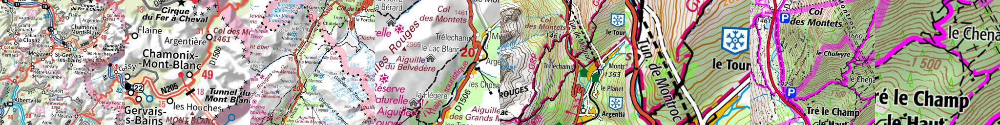

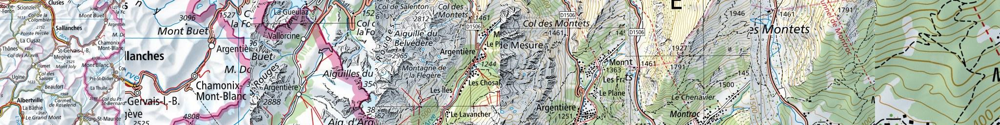

In [21]:
for dname in 'ignweb', 'chdz':
    display(makepy(dname, 'montets'))

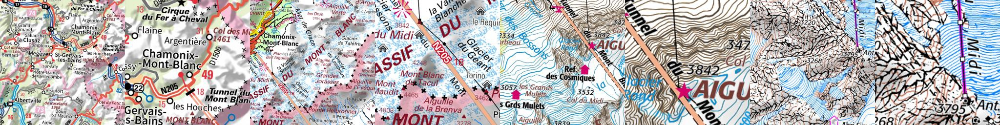

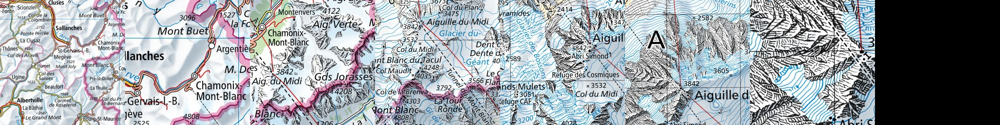

In [11]:
for dname in 'ignweb', 'chdz':
    display(makepy(dname, 'midi'))

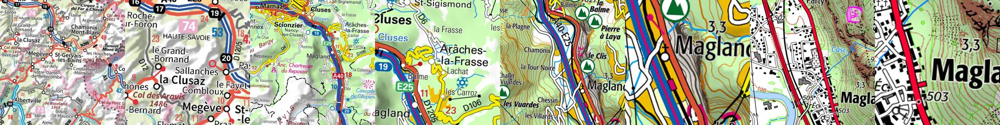

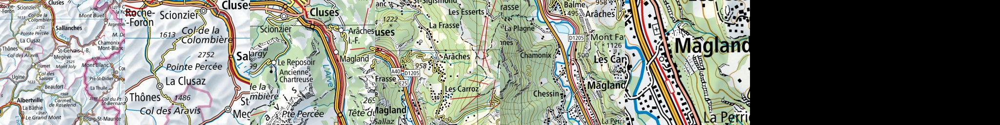

In [13]:
for dname in 'ignweb', 'chdz':
    display(makepy(dname, 'magland'))

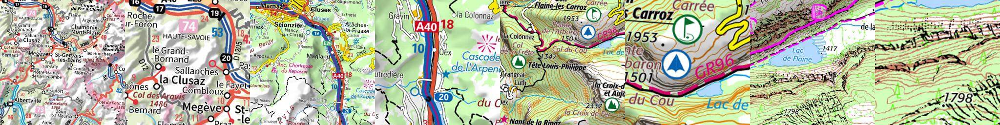

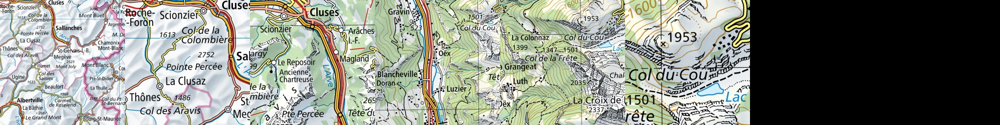

In [15]:
for dname in 'ignweb', 'chdz':
    display(makepy(dname, 'flainel'))

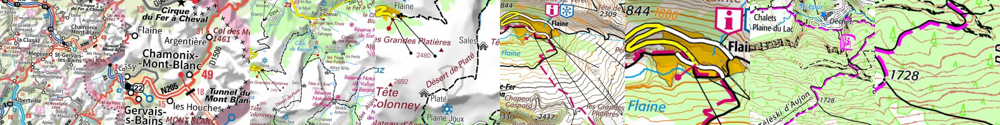

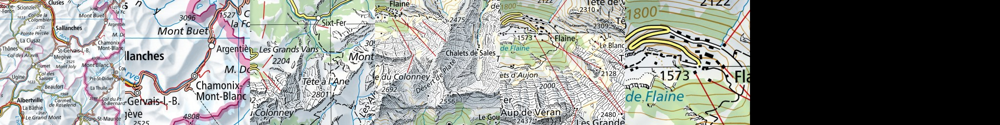

In [16]:
for dname in 'ignweb', 'chdz':
    display(makepy(dname, 'flaine'))

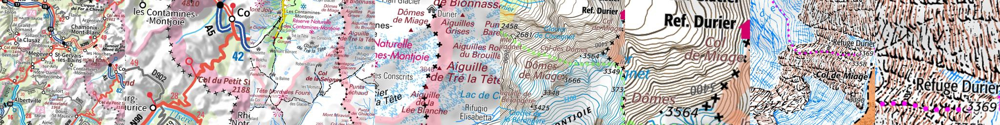

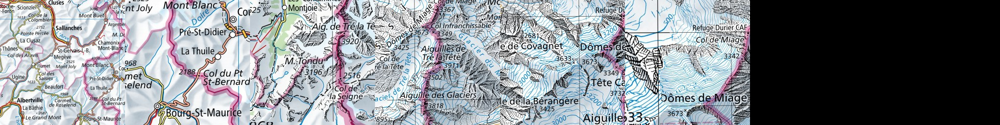

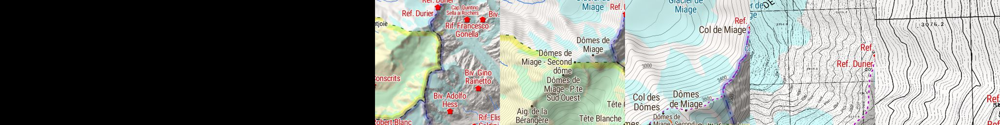

In [25]:
for dname in 'ignweb', 'chdz', 'bugianen':
    display(makepy(dname, 'miage'))